In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
data=pd.read_csv("dataset/cancer_reg.csv",encoding = "ISO-8859-1")

In [3]:
data.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,"(61494.5, 125635]",39.3,...,NaN,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,"(48021.6, 51046.4]",33.0,...,53.8,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,"(48021.6, 51046.4]",45.0,...,43.5,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,"(42724.4, 45201]",42.8,...,40.3,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,"(48021.6, 51046.4]",48.3,...,43.9,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              3047 non-null   float64
 1   avgDeathsPerYear         3047 non-null   int64  
 2   TARGET_deathRate         3047 non-null   float64
 3   incidenceRate            3047 non-null   float64
 4   medIncome                3047 non-null   int64  
 5   popEst2015               3047 non-null   int64  
 6   povertyPercent           3047 non-null   float64
 7   studyPerCap              3047 non-null   float64
 8   binnedInc                3047 non-null   object 
 9   MedianAge                3047 non-null   float64
 10  MedianAgeMale            3047 non-null   float64
 11  MedianAgeFemale          3047 non-null   float64
 12  Geography                3047 non-null   object 
 13  AvgHouseholdSize         3047 non-null   float64
 14  PercentMarried          

In [5]:
data.describe(include='all')

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
count,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3.047000e+03,3047.000000,3047.000000,3047,3047.000000,...,2438.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"(54545.6, 61494.5]",NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,306,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,606.338544,185.965868,178.664063,448.268586,47063.281917,1.026374e+05,16.878175,155.399415,NaN,45.272333,...,48.453774,41.196324,36.252642,19.240072,83.645286,9.107978,1.253965,1.983523,51.243872,5.640306
std,1416.356223,504.134286,27.751511,54.560733,12040.090836,3.290592e+05,6.409087,529.628366,NaN,45.304480,...,10.083006,9.447687,7.841741,6.113041,16.380025,14.534538,2.610276,3.517710,6.572814,1.985816
min,6.000000,3.000000,59.700000,201.300000,22640.000000,8.270000e+02,3.200000,0.000000,NaN,22.300000,...,15.700000,13.500000,11.200000,2.600000,10.199155,0.000000,0.000000,0.000000,22.992490,0.000000
25%,76.000000,28.000000,161.200000,420.300000,38882.500000,1.168400e+04,12.150000,0.000000,NaN,37.700000,...,41.000000,34.500000,30.900000,14.850000,77.296180,0.620675,0.254199,0.295172,47.763063,4.521419
50%,171.000000,61.000000,178.100000,453.549422,45207.000000,2.664300e+04,15.900000,0.000000,NaN,41.000000,...,48.700000,41.100000,36.300000,18.800000,90.059774,2.247576,0.549812,0.826185,51.669941,5.381478
75%,518.000000,149.000000,195.200000,480.850000,52492.000000,6.867100e+04,20.400000,83.650776,NaN,44.000000,...,55.600000,47.700000,41.550000,23.100000,95.451693,10.509732,1.221037,2.177960,55.395132,6.493677


<h3>handling missing data

In [6]:
missing=data.isnull()
missing.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,False,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [7]:
for column in missing.columns.values.tolist():
    print(column)
    print(missing[column].value_counts())
    print("")

avgAnnCount
False    3047
Name: avgAnnCount, dtype: int64

avgDeathsPerYear
False    3047
Name: avgDeathsPerYear, dtype: int64

TARGET_deathRate
False    3047
Name: TARGET_deathRate, dtype: int64

incidenceRate
False    3047
Name: incidenceRate, dtype: int64

medIncome
False    3047
Name: medIncome, dtype: int64

popEst2015
False    3047
Name: popEst2015, dtype: int64

povertyPercent
False    3047
Name: povertyPercent, dtype: int64

studyPerCap
False    3047
Name: studyPerCap, dtype: int64

binnedInc
False    3047
Name: binnedInc, dtype: int64

MedianAge
False    3047
Name: MedianAge, dtype: int64

MedianAgeMale
False    3047
Name: MedianAgeMale, dtype: int64

MedianAgeFemale
False    3047
Name: MedianAgeFemale, dtype: int64

Geography
False    3047
Name: Geography, dtype: int64

AvgHouseholdSize
False    3047
Name: AvgHouseholdSize, dtype: int64

PercentMarried
False    3047
Name: PercentMarried, dtype: int64

PctNoHS18_24
False    3047
Name: PctNoHS18_24, dtype: int64

PctHS18_24
Fal

Based on the summary above, each column has 3047 rows of data, 

3 columns contain missing values

    1.PctSomeCol18_24 : 2285
    2.PctEmployed16_Over :  152 
    3.PctPrivateCoverageAlone :  609




PctSomeCol18_24 has 74% missing value <br>
PctEmployed16_Over has 4% missing value <br>
PctPrivateCoverageAlone has 19.98% missing value 

so we can drop the PctSomeCol18_24 column
and replace the missing value of PctEmployed16_Over, PctPrivateCoverageAlone with there mean

Text(0.5, 1.0, 'columns')

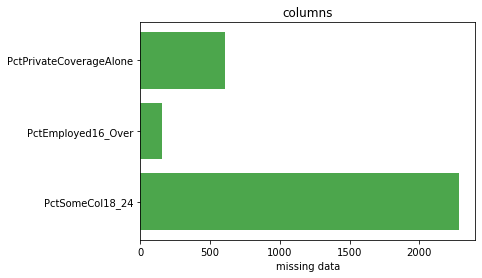

In [8]:
objects=('PctSomeCol18_24','PctEmployed16_Over','PctPrivateCoverageAlone')
y_pos=np.arange(len(objects))
miss=[2285,152,609]
plt.barh(y_pos, miss, align='center', color='g',alpha=0.7)
plt.yticks(y_pos, objects)
plt.xlabel('missing data')
plt.title('columns')

<h3>Replaceing missing 

In [9]:
avg_PctEmp=data['PctEmployed16_Over'].astype('float').mean(axis=0)
print("avg loss of PctEmployed16_Over",avg_PctEmp)
avg_PctPri=data['PctPrivateCoverageAlone'].astype('float').mean(axis=0)
print("avg loss of PctPrivateCoverageAlone",avg_PctPri)

avg loss of PctEmployed16_Over 54.15264248704645
avg loss of PctPrivateCoverageAlone 48.45377358490559


In [10]:
data['PctEmployed16_Over'].replace(np.nan,avg_PctEmp,inplace=True)
data['PctPrivateCoverageAlone'].replace(np.nan,avg_PctEmp,inplace=True)

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              3047 non-null   float64
 1   avgDeathsPerYear         3047 non-null   int64  
 2   TARGET_deathRate         3047 non-null   float64
 3   incidenceRate            3047 non-null   float64
 4   medIncome                3047 non-null   int64  
 5   popEst2015               3047 non-null   int64  
 6   povertyPercent           3047 non-null   float64
 7   studyPerCap              3047 non-null   float64
 8   binnedInc                3047 non-null   object 
 9   MedianAge                3047 non-null   float64
 10  MedianAgeMale            3047 non-null   float64
 11  MedianAgeFemale          3047 non-null   float64
 12  Geography                3047 non-null   object 
 13  AvgHouseholdSize         3047 non-null   float64
 14  PercentMarried          

<h3> Droping columns

In [12]:
data.drop(['PctSomeCol18_24'],axis=1,inplace=True)

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              3047 non-null   float64
 1   avgDeathsPerYear         3047 non-null   int64  
 2   TARGET_deathRate         3047 non-null   float64
 3   incidenceRate            3047 non-null   float64
 4   medIncome                3047 non-null   int64  
 5   popEst2015               3047 non-null   int64  
 6   povertyPercent           3047 non-null   float64
 7   studyPerCap              3047 non-null   float64
 8   binnedInc                3047 non-null   object 
 9   MedianAge                3047 non-null   float64
 10  MedianAgeMale            3047 non-null   float64
 11  MedianAgeFemale          3047 non-null   float64
 12  Geography                3047 non-null   object 
 13  AvgHouseholdSize         3047 non-null   float64
 14  PercentMarried          

<h3>Visualising the data

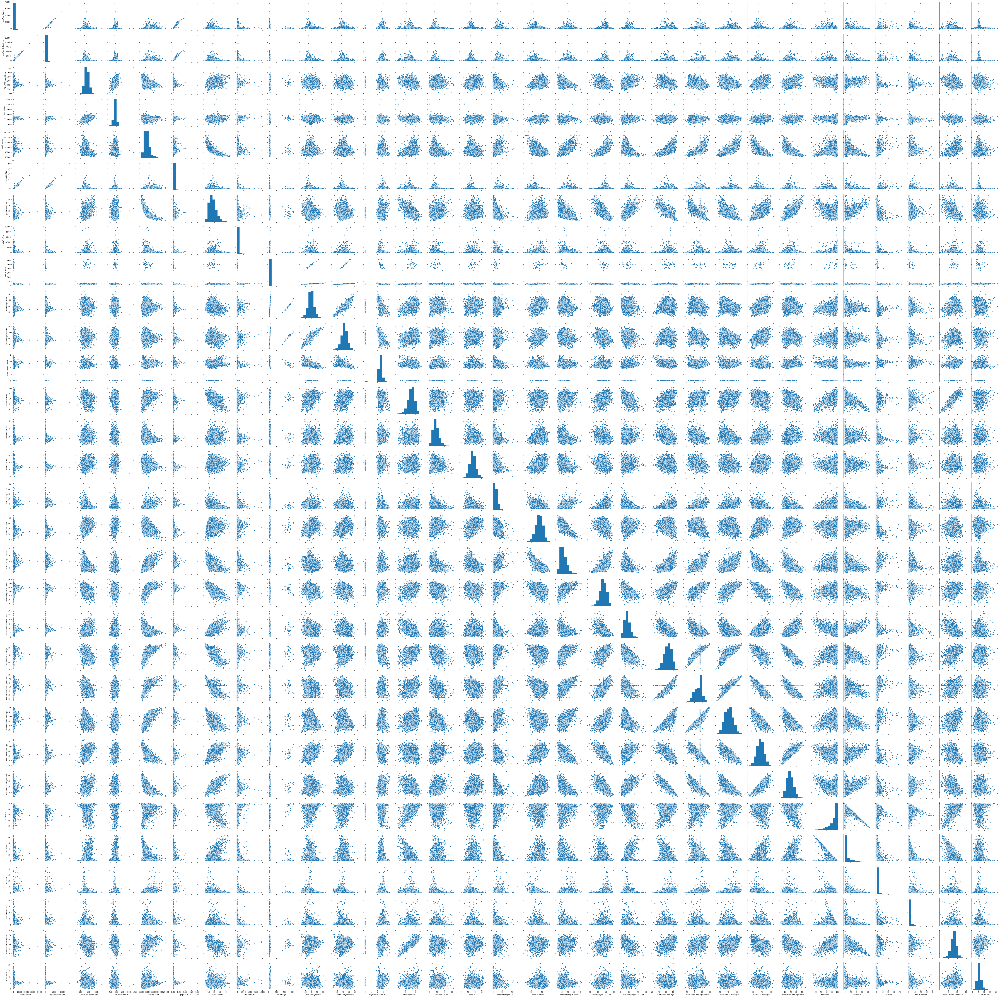

In [14]:
sns.pairplot(data)
plt.show()

In [15]:
x=data

In [16]:
x.describe()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
count,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3.047000e+03,3047.000000,3047.000000,3047.000000,3047.000000,...,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000
mean,606.338544,185.965868,178.664063,448.268586,47063.281917,1.026374e+05,16.878175,155.399415,45.272333,39.570725,...,49.592799,41.196324,36.252642,19.240072,83.645286,9.107978,1.253965,1.983523,51.243872,5.640306
std,1416.356223,504.134286,27.751511,54.560733,12040.090836,3.290592e+05,6.409087,529.628366,45.304480,5.226017,...,9.302461,9.447687,7.841741,6.113041,16.380025,14.534538,2.610276,3.517710,6.572814,1.985816
min,6.000000,3.000000,59.700000,201.300000,22640.000000,8.270000e+02,3.200000,0.000000,22.300000,22.400000,...,15.700000,13.500000,11.200000,2.600000,10.199155,0.000000,0.000000,0.000000,22.992490,0.000000
25%,76.000000,28.000000,161.200000,420.300000,38882.500000,1.168400e+04,12.150000,0.000000,37.700000,36.350000,...,43.100000,34.500000,30.900000,14.850000,77.296180,0.620675,0.254199,0.295172,47.763063,4.521419
50%,171.000000,61.000000,178.100000,453.549422,45207.000000,2.664300e+04,15.900000,0.000000,41.000000,39.600000,...,51.900000,41.100000,36.300000,18.800000,90.059774,2.247576,0.549812,0.826185,51.669941,5.381478
75%,518.000000,149.000000,195.200000,480.850000,52492.000000,6.867100e+04,20.400000,83.650776,44.000000,42.500000,...,54.152642,47.700000,41.550000,23.100000,95.451693,10.509732,1.221037,2.177960,55.395132,6.493677
max,38150.000000,14010.000000,362.800000,1206.900000,125635.000000,1.017029e+07,47.400000,9762.308998,624.000000,64.700000,...,78.900000,70.700000,65.100000,46.600000,100.000000,85.947799,42.619425,41.930251,78.075397,21.326165


<Figure size 1440x720 with 0 Axes>

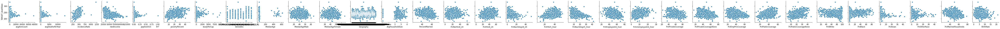

In [17]:
plt.figure(figsize=(20,10))
sns.pairplot(x_vars=['avgAnnCount','avgDeathsPerYear','incidenceRate','medIncome','popEst2015','povertyPercent','studyPerCap','binnedInc','MedianAge','MedianAgeMale','MedianAgeFemale','Geography','AvgHouseholdSize','PercentMarried','PctNoHS18_24','PctHS18_24','PctBachDeg18_24','PctHS25_Over','PctBachDeg25_Over','PctEmployed16_Over','PctUnemployed16_Over','PctPrivateCoverage','PctPrivateCoverageAlone','PctEmpPrivCoverage','PctPublicCoverage','PctPublicCoverageAlone','PctWhite','PctBlack','PctAsian','PctOtherRace','PctMarriedHouseholds','BirthRate'],y_vars=['TARGET_deathRate'],data=data,palette='hus1')
plt.show()

<h3>Visualising categorical value

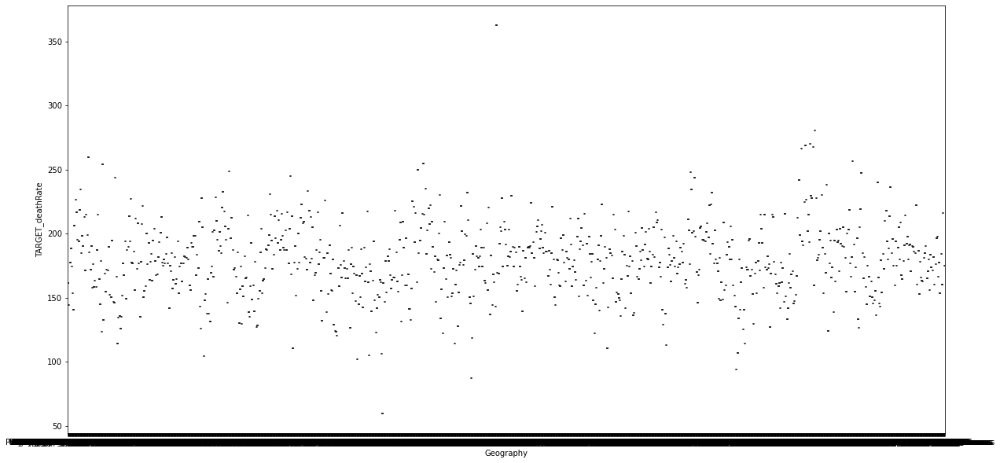

In [18]:
plt.figure(figsize=(20,10))
sns.boxplot(x='Geography',y='TARGET_deathRate',data=data,palette='Blues')

In [19]:
data['Geography'].head(10)

0          Kitsap County, Washington
1        Kittitas County, Washington
2       Klickitat County, Washington
3           Lewis County, Washington
4         Lincoln County, Washington
5           Mason County, Washington
6        Okanogan County, Washington
7         Pacific County, Washington
8    Pend Oreille County, Washington
9          Pierce County, Washington
Name: Geography, dtype: object

from here we can see all Geography is different but they has the state name as common so we can change the geogrphy to the state name

In [20]:
data[['first','Geography']] = data.Geography.str.split(", ",expand=True)

In [21]:
data.drop(['first'],axis=1,inplace=True)

In [22]:
data['Geography'].head()

0    Washington
1    Washington
2    Washington
3    Washington
4    Washington
Name: Geography, dtype: object

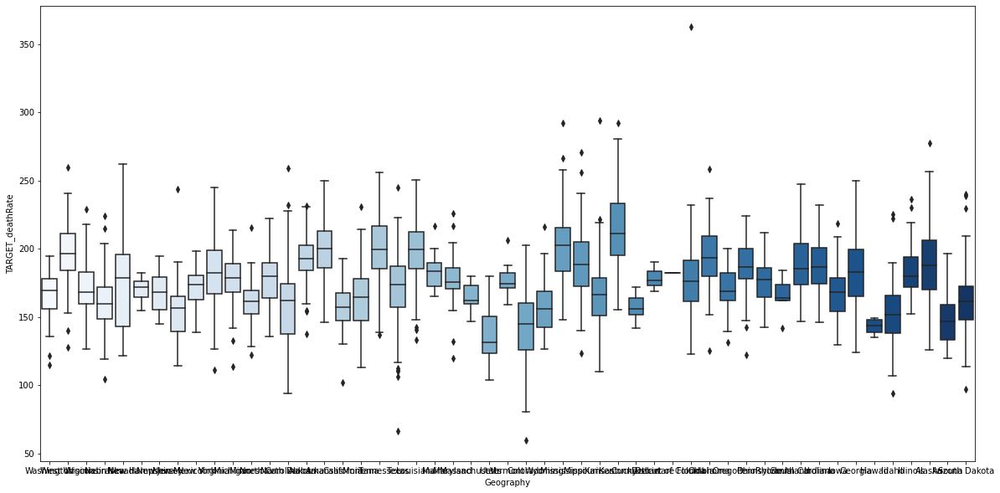

In [23]:
plt.figure(figsize=(20,10))
sns.boxplot(x='Geography',y='TARGET_deathRate',data=data,palette='Blues')

In [24]:
data.Geography.value_counts()

Texas                   233
Georgia                 155
Virginia                125
Kentucky                120
Missouri                115
Illinois                102
Kansas                  102
Iowa                     99
North Carolina           99
Tennessee                95
Indiana                  92
Ohio                     87
Minnesota                87
Michigan                 83
Mississippi              82
Nebraska                 80
Oklahoma                 77
Arkansas                 75
Wisconsin                72
Pennsylvania             67
Florida                  66
Louisiana                64
Alabama                  63
New York                 62
Colorado                 60
South Dakota             59
California               57
West Virginia            55
North Dakota             51
Montana                  48
South Carolina           46
Idaho                    42
Washington               39
Oregon                   36
New Mexico               32
Utah                

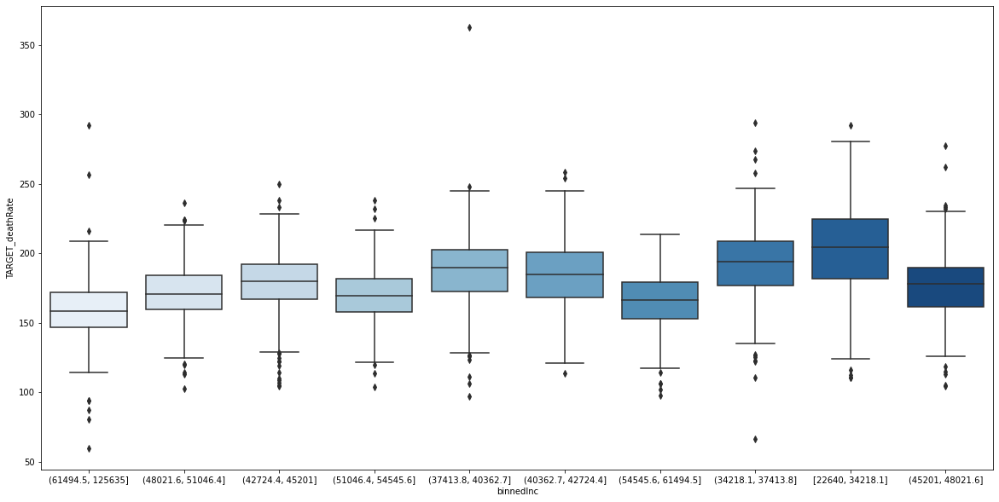

In [25]:
plt.figure(figsize=(20,10))
sns.boxplot(x='binnedInc',y='TARGET_deathRate',data=data,palette='Blues')

<h3>Dummy variable

In [26]:
binned=pd.get_dummies(data['binnedInc'],drop_first=True)
binned.head()
binned.shape

(3047, 9)

In [27]:
geo=pd.get_dummies(data['Geography'],drop_first=True)
geo.shape

(3047, 50)

In [28]:
data=pd.concat([data,binned],axis=1)
data.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,BirthRate,"(37413.8, 40362.7]","(40362.7, 42724.4]","(42724.4, 45201]","(45201, 48021.6]","(48021.6, 51046.4]","(51046.4, 54545.6]","(54545.6, 61494.5]","(61494.5, 125635]","[22640, 34218.1]"
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,"(61494.5, 125635]",39.3,...,6.118831,0,0,0,0,0,0,0,1,0
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,"(48021.6, 51046.4]",33.0,...,4.333096,0,0,0,0,1,0,0,0,0
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,"(48021.6, 51046.4]",45.0,...,3.729488,0,0,0,0,1,0,0,0,0
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,"(42724.4, 45201]",42.8,...,4.603841,0,0,1,0,0,0,0,0,0
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,"(48021.6, 51046.4]",48.3,...,6.796657,0,0,0,0,1,0,0,0,0


In [29]:
data.drop(['binnedInc'],axis=1,inplace=True)
data.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,BirthRate,"(37413.8, 40362.7]","(40362.7, 42724.4]","(42724.4, 45201]","(45201, 48021.6]","(48021.6, 51046.4]","(51046.4, 54545.6]","(54545.6, 61494.5]","(61494.5, 125635]","[22640, 34218.1]"
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,39.3,36.9,...,6.118831,0,0,0,0,0,0,0,1,0
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,33.0,32.2,...,4.333096,0,0,0,0,1,0,0,0,0
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,45.0,44.0,...,3.729488,0,0,0,0,1,0,0,0,0
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,42.8,42.2,...,4.603841,0,0,1,0,0,0,0,0,0
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,48.3,47.8,...,6.796657,0,0,0,0,1,0,0,0,0


In [30]:
data=pd.concat([data,geo],axis=1)
data.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,39.3,36.9,...,0,0,0,0,0,0,1,0,0,0
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,33.0,32.2,...,0,0,0,0,0,0,1,0,0,0
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,45.0,44.0,...,0,0,0,0,0,0,1,0,0,0
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,42.8,42.2,...,0,0,0,0,0,0,1,0,0,0
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,48.3,47.8,...,0,0,0,0,0,0,1,0,0,0


In [31]:
data.drop(['Geography'],axis=1,inplace=True)
data.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,39.3,36.9,...,0,0,0,0,0,0,1,0,0,0
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,33.0,32.2,...,0,0,0,0,0,0,1,0,0,0
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,45.0,44.0,...,0,0,0,0,0,0,1,0,0,0
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,42.8,42.2,...,0,0,0,0,0,0,1,0,0,0
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,48.3,47.8,...,0,0,0,0,0,0,1,0,0,0


In [32]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 90 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              3047 non-null   float64
 1   avgDeathsPerYear         3047 non-null   int64  
 2   TARGET_deathRate         3047 non-null   float64
 3   incidenceRate            3047 non-null   float64
 4   medIncome                3047 non-null   int64  
 5   popEst2015               3047 non-null   int64  
 6   povertyPercent           3047 non-null   float64
 7   studyPerCap              3047 non-null   float64
 8   MedianAge                3047 non-null   float64
 9   MedianAgeMale            3047 non-null   float64
 10  MedianAgeFemale          3047 non-null   float64
 11  AvgHouseholdSize         3047 non-null   float64
 12  PercentMarried           3047 non-null   float64
 13  PctNoHS18_24             3047 non-null   float64
 14  PctHS18_24              

<h3> Spliting data into train and test

In [33]:
from sklearn.model_selection import train_test_split
df_train,df_test=train_test_split(data,train_size=0.75,test_size=0.25,random_state=100)

In [34]:
df_train.shape

(2285, 90)

In [35]:
df_test.shape

(762, 90)

<h3> Rescaling

In [36]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()

In [37]:
convars=['avgAnnCount','avgDeathsPerYear','TARGET_deathRate','incidenceRate','medIncome','popEst2015','povertyPercent','studyPerCap','MedianAge','MedianAgeMale','MedianAgeFemale','AvgHouseholdSize','PercentMarried','PctNoHS18_24','PctHS18_24','PctBachDeg18_24','PctHS25_Over','PctBachDeg25_Over','PctEmployed16_Over','PctUnemployed16_Over','PctPrivateCoverage','PctPrivateCoverageAlone','PctEmpPrivCoverage','PctPublicCoverage','PctPublicCoverageAlone','PctWhite','PctBlack','PctAsian','PctOtherRace','PctMarriedHouseholds','BirthRate']
df_train[convars]=scaler.fit_transform(df_train[convars])
df_train.head()

C:\Users\kanan\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\kanan\AppData\Roaming\Python\Python36\site-packages\pandas\core\indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
528,0.002228,0.003213,0.414244,0.193914,0.177638,0.001612,0.315789,0.000000,0.030081,0.397163,...,0,0,0,0,0,0,0,0,0,0
16,0.036258,0.034269,0.299055,0.292959,0.390126,0.026377,0.187643,0.021282,0.026924,0.347518,...,0,0,0,0,0,0,1,0,0,0
2664,0.002281,0.002642,0.338299,0.224344,0.124379,0.001736,0.526316,0.000000,0.027755,0.347518,...,0,0,0,0,0,0,0,0,0,0
2907,0.004195,0.004569,0.379724,0.297136,0.156888,0.002285,0.395881,0.000000,0.033405,0.430260,...,0,0,0,0,0,0,0,0,0,0
1793,0.004037,0.004284,0.260538,0.209626,0.245868,0.003856,0.281465,0.000000,0.022104,0.264775,...,0,0,1,0,0,0,0,0,0,0


<h3>divide it in x and y sets for model build

In [38]:
y_train=df_train.pop("TARGET_deathRate")
X_train=df_train

<h3>heatmap

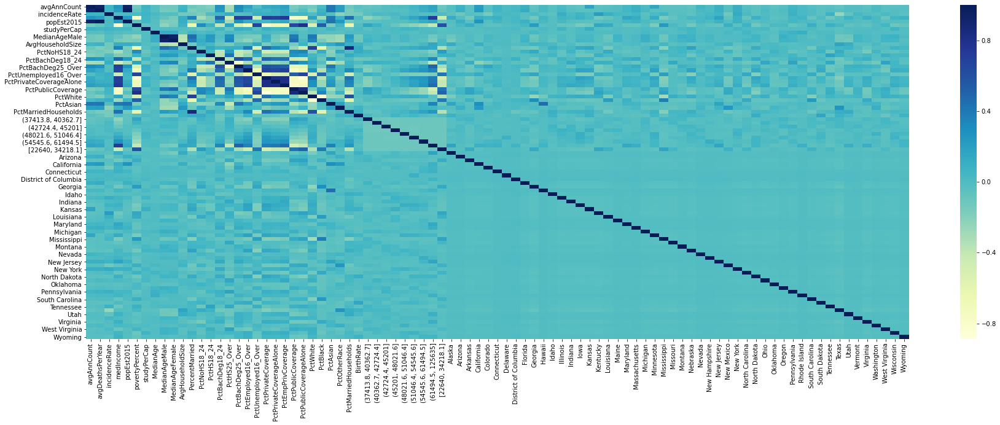

In [39]:
plt.figure(figsize = (30, 10))
sns.heatmap(df_train.corr(), cmap="YlGnBu")
plt.show()

<h2> model building

using RFE

In [40]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [41]:
lm=LinearRegression()
lm.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [42]:
rfe=RFE(lm,70)
rfe=rfe.fit(X_train,y_train)

In [43]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('avgAnnCount', True, 1),
 ('avgDeathsPerYear', True, 1),
 ('incidenceRate', True, 1),
 ('medIncome', True, 1),
 ('popEst2015', True, 1),
 ('povertyPercent', False, 8),
 ('studyPerCap', True, 1),
 ('MedianAge', False, 7),
 ('MedianAgeMale', False, 9),
 ('MedianAgeFemale', True, 1),
 ('AvgHouseholdSize', True, 1),
 ('PercentMarried', True, 1),
 ('PctNoHS18_24', True, 1),
 ('PctHS18_24', True, 1),
 ('PctBachDeg18_24', True, 1),
 ('PctHS25_Over', True, 1),
 ('PctBachDeg25_Over', True, 1),
 ('PctEmployed16_Over', True, 1),
 ('PctUnemployed16_Over', True, 1),
 ('PctPrivateCoverage', True, 1),
 ('PctPrivateCoverageAlone', True, 1),
 ('PctEmpPrivCoverage', False, 16),
 ('PctPublicCoverage', True, 1),
 ('PctPublicCoverageAlone', True, 1),
 ('PctWhite', True, 1),
 ('PctBlack', True, 1),
 ('PctAsian', False, 4),
 ('PctOtherRace', True, 1),
 ('PctMarriedHouseholds', True, 1),
 ('BirthRate', True, 1),
 ('(37413.8, 40362.7]', False, 10),
 ('(40362.7, 42724.4]', False, 2),
 ('(42724.4, 45201]', Fal

In [44]:
col=X_train.columns[rfe.support_]

In [85]:
col

Index(['avgAnnCount', 'avgDeathsPerYear', 'incidenceRate', 'medIncome',
       'popEst2015', 'studyPerCap', 'MedianAgeFemale', 'AvgHouseholdSize',
       'PercentMarried', 'PctNoHS18_24', 'PctHS18_24', 'PctBachDeg18_24',
       'PctHS25_Over', 'PctBachDeg25_Over', 'PctEmployed16_Over',
       'PctUnemployed16_Over', 'PctPrivateCoverage', 'PctPrivateCoverageAlone',
       'PctPublicCoverage', 'PctPublicCoverageAlone', 'PctWhite', 'PctBlack',
       'PctOtherRace', 'PctMarriedHouseholds', 'BirthRate', '(45201, 48021.6]',
       '(48021.6, 51046.4]', '(51046.4, 54545.6]', '[22640, 34218.1]',
       'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado',
       'Connecticut', 'Delaware', 'Georgia', 'Hawaii', 'Idaho', 'Illinois',
       'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Massachusetts', 'Michigan',
       'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada',
       'New Hampshire', 'New Jersey', 'New Mexico', 'New York',
       'North Carolina', 'North Dakota', 'Oklahoma', '

<h3> mmodel building using statsmodel

In [46]:
X_train_rfe=X_train[col]

In [47]:
import statsmodels.api as sm
X_train_rfe=sm.add_constant(X_train_rfe)

In [48]:
lm=sm.OLS(y_train,X_train_rfe).fit()

In [49]:
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:       TARGET_deathRate   R-squared:                       0.591
Model:                            OLS   Adj. R-squared:                  0.578
Method:                 Least Squares   F-statistic:                     45.62
Date:                Wed, 12 Aug 2020   Prob (F-statistic):               0.00
Time:                        23:17:48   Log-Likelihood:                 3047.8
No. Observations:                2285   AIC:                            -5954.
Df Residuals:                    2214   BIC:                            -5546.
Df Model:                          70                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

PctNoHS18_24    0.603<br>
PctPrivateCoverage   0.647<br>
PctPublicCoverage    0.659 -> is insignificant in presence of other variables 

In [50]:
X_train_2=X_train_rfe.drop(['PctPublicCoverage','PctNoHS18_24','PctPrivateCoverage'],axis=1)
X_train_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2285 entries, 528 to 1544
Data columns (total 68 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   const                    2285 non-null   float64
 1   avgAnnCount              2285 non-null   float64
 2   avgDeathsPerYear         2285 non-null   float64
 3   incidenceRate            2285 non-null   float64
 4   medIncome                2285 non-null   float64
 5   popEst2015               2285 non-null   float64
 6   studyPerCap              2285 non-null   float64
 7   MedianAgeFemale          2285 non-null   float64
 8   AvgHouseholdSize         2285 non-null   float64
 9   PercentMarried           2285 non-null   float64
 10  PctHS18_24               2285 non-null   float64
 11  PctBachDeg18_24          2285 non-null   float64
 12  PctHS25_Over             2285 non-null   float64
 13  PctBachDeg25_Over        2285 non-null   float64
 14  PctEmployed16_Over    

rebuilding

In [51]:
X_train_2=sm.add_constant(X_train_2)

In [52]:
lm2=sm.OLS(y_train,X_train_2).fit()

In [53]:
print(lm2.summary())

                            OLS Regression Results                            
Dep. Variable:       TARGET_deathRate   R-squared:                       0.590
Model:                            OLS   Adj. R-squared:                  0.578
Method:                 Least Squares   F-statistic:                     47.71
Date:                Wed, 12 Aug 2020   Prob (F-statistic):               0.00
Time:                        23:17:49   Log-Likelihood:                 3047.5
No. Observations:                2285   AIC:                            -5959.
Df Residuals:                    2217   BIC:                            -5569.
Df Model:                          67                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

studyPerCap      0.437<br>
Delaware         0.371<br>
New Hampshire    0.401<br>
Texas            0.312<br> 
Vermont          0.360<br>
is insignificant in presence of other variables

In [54]:
X_train_3=X_train_2.drop(['studyPerCap','Delaware','New Hampshire','Texas','Vermont'],axis=1)
X_train_3=sm.add_constant(X_train_3)
lm3=sm.OLS(y_train,X_train_3).fit()
print(lm3.summary())

                            OLS Regression Results                            
Dep. Variable:       TARGET_deathRate   R-squared:                       0.590
Model:                            OLS   Adj. R-squared:                  0.578
Method:                 Least Squares   F-statistic:                     51.50
Date:                Wed, 12 Aug 2020   Prob (F-statistic):               0.00
Time:                        23:17:49   Log-Likelihood:                 3045.4
No. Observations:                2285   AIC:                            -5965.
Df Residuals:                    2222   BIC:                            -5603.
Df Model:                          62                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

medIncome                  0.147<br>
AvgHouseholdSize           0.138<br>
AvgHouseholdSize    0.084<br>
(45201, 48021.6]            0.223<br>
(48021.6, 51046.4]        0.055<br>
(51046.4, 54545.6]          0.080 <br>
Illinois                   0.071<br>
Indiana                   0.073 <br>
Michigan                  0.115 <br>
Missouri                   0.107<br>
Nevada                     0.224<br>
New Jersey                 0.126<br>
North Dakota               0.088<br>
Rhode Island               0.224<br>
Wisconsin                  0.061<br>
Wyoming                    0.192 <br>
 is insignificant in presence of other variables

In [55]:
X_train_4=X_train_3.drop(['medIncome','AvgHouseholdSize','AvgHouseholdSize','PctPrivateCoverageAlone','(45201, 48021.6]','(48021.6, 51046.4]','(51046.4, 54545.6]','Illinois','Indiana','Michigan','Missouri','Nevada','New Jersey','North Dakota','Rhode Island','Wisconsin','Wyoming'],axis=1)
X_train_4=sm.add_constant(X_train_4)
lm4=sm.OLS(y_train,X_train_4).fit()
print(lm4.summary())

                            OLS Regression Results                            
Dep. Variable:       TARGET_deathRate   R-squared:                       0.582
Model:                            OLS   Adj. R-squared:                  0.574
Method:                 Least Squares   F-statistic:                     67.86
Date:                Wed, 12 Aug 2020   Prob (F-statistic):               0.00
Time:                        23:17:49   Log-Likelihood:                 3025.4
No. Observations:                2285   AIC:                            -5957.
Df Residuals:                    2238   BIC:                            -5687.
Df Model:                          46                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

PctBachDeg18_24         0.066<br>
PctEmployed16_Over      0.066 <br>
is insignificant in presence of other variables

In [56]:
X_train_5=X_train_4.drop(['PctBachDeg18_24','PctEmployed16_Over'],axis=1)
X_train_5=sm.add_constant(X_train_5)
lm5=sm.OLS(y_train,X_train_5).fit()
print(lm5.summary())

                            OLS Regression Results                            
Dep. Variable:       TARGET_deathRate   R-squared:                       0.581
Model:                            OLS   Adj. R-squared:                  0.573
Method:                 Least Squares   F-statistic:                     70.61
Date:                Wed, 12 Aug 2020   Prob (F-statistic):               0.00
Time:                        23:17:49   Log-Likelihood:                 3021.6
No. Observations:                2285   AIC:                            -5953.
Df Residuals:                    2240   BIC:                            -5695.
Df Model:                          44                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

popEst2015         0.053<br>
PercentMarried     0.059<br> 
Connecticut         0.057 <br> delete them

In [57]:
X_train_6=X_train_5.drop(['popEst2015','PercentMarried','Connecticut'],axis=1)
X_train_6=sm.add_constant(X_train_6)
lm6=sm.OLS(y_train,X_train_6).fit()
print(lm6.summary())

                            OLS Regression Results                            
Dep. Variable:       TARGET_deathRate   R-squared:                       0.579
Model:                            OLS   Adj. R-squared:                  0.571
Method:                 Least Squares   F-statistic:                     75.24
Date:                Wed, 12 Aug 2020   Prob (F-statistic):               0.00
Time:                        23:17:49   Log-Likelihood:                 3016.0
No. Observations:                2285   AIC:                            -5948.
Df Residuals:                    2243   BIC:                            -5707.
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [58]:
X_train_6.columns

Index(['const', 'avgAnnCount', 'avgDeathsPerYear', 'incidenceRate',
       'MedianAgeFemale', 'PctHS18_24', 'PctHS25_Over', 'PctBachDeg25_Over',
       'PctUnemployed16_Over', 'PctPublicCoverageAlone', 'PctWhite',
       'PctBlack', 'PctOtherRace', 'PctMarriedHouseholds', 'BirthRate',
       '[22640, 34218.1]', 'Alaska', 'Arizona', 'Arkansas', 'California',
       'Colorado', 'Georgia', 'Hawaii', 'Idaho', 'Iowa', 'Kansas', 'Kentucky',
       'Massachusetts', 'Mississippi', 'Montana', 'Nebraska', 'New Mexico',
       'New York', 'North Carolina', 'Oklahoma', 'Oregon', 'Pennsylvania',
       'South Dakota', 'Tennessee', 'Utah', 'Virginia', 'Washington'],
      dtype='object')

<h3>calculate vif

In [59]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
X=X_train_6
vif['features']=X.columns
vif['VIF']=[variance_inflation_factor(X.values,i) for i in range(X.shape[1])]
vif['VIF']=round(vif['VIF'],2)
vif=vif.sort_values(by = "VIF",ascending=False)
vif

,features,VIF
0,const,491.17
1,avgAnnCount,17.78
2,avgDeathsPerYear,17.14
10,PctWhite,8.44
11,PctBlack,7.34
7,PctBachDeg25_Over,4.56
6,PctHS25_Over,4.07
9,PctPublicCoverageAlone,3.74
8,PctUnemployed16_Over,2.65
13,PctMarriedHouseholds,2.30


In [60]:
a=X.drop(['avgAnnCount','avgDeathsPerYear','PctWhite','PctBlack'],axis=1)
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif2=pd.DataFrame()
vif2['features']=a.columns
vif2['VIF']=[variance_inflation_factor(a.values,i) for i in range(a.shape[1])]
vif2['VIF']=round(vif2['VIF'],2)
vif2=vif2.sort_values(by = "VIF",ascending=False)
vif2

,features,VIF
0,const,272.85
5,PctBachDeg25_Over,4.33
4,PctHS25_Over,4.05
7,PctPublicCoverageAlone,3.61
6,PctUnemployed16_Over,2.38
9,PctMarriedHouseholds,1.80
2,MedianAgeFemale,1.49
8,PctOtherRace,1.49
3,PctHS18_24,1.48
11,"[22640, 34218.1]",1.48


In [61]:
X_train_7=X_train_6.drop(['avgAnnCount','avgDeathsPerYear','PctWhite','PctBlack'],axis=1)
X_train_7=sm.add_constant(X_train_7)
lm7=sm.OLS(y_train,X_train_7).fit()
print(lm7.summary())

                            OLS Regression Results                            
Dep. Variable:       TARGET_deathRate   R-squared:                       0.566
Model:                            OLS   Adj. R-squared:                  0.559
Method:                 Least Squares   F-statistic:                     79.34
Date:                Wed, 12 Aug 2020   Prob (F-statistic):               0.00
Time:                        23:17:51   Log-Likelihood:                 2982.4
No. Observations:                2285   AIC:                            -5889.
Df Residuals:                    2247   BIC:                            -5671.
Df Model:                          37                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [62]:
X_train_8=X_train_7.drop(['Washington','South Dakota','Nebraska','Mississippi','Kansas'],axis=1)
X_train_8=sm.add_constant(X_train_8)
lm8=sm.OLS(y_train,X_train_8).fit()
print(lm8.summary())

                            OLS Regression Results                            
Dep. Variable:       TARGET_deathRate   R-squared:                       0.564
Model:                            OLS   Adj. R-squared:                  0.558
Method:                 Least Squares   F-statistic:                     90.93
Date:                Wed, 12 Aug 2020   Prob (F-statistic):               0.00
Time:                        23:17:51   Log-Likelihood:                 2975.2
No. Observations:                2285   AIC:                            -5884.
Df Residuals:                    2252   BIC:                            -5695.
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [63]:
X_train_9=X_train_8.drop(['Massachusetts'],axis=1)
X_train_9=sm.add_constant(X_train_9)
lm9=sm.OLS(y_train,X_train_9).fit()
print(lm9.summary())

                            OLS Regression Results                            
Dep. Variable:       TARGET_deathRate   R-squared:                       0.563
Model:                            OLS   Adj. R-squared:                  0.557
Method:                 Least Squares   F-statistic:                     93.64
Date:                Wed, 12 Aug 2020   Prob (F-statistic):               0.00
Time:                        23:17:51   Log-Likelihood:                 2973.5
No. Observations:                2285   AIC:                            -5883.
Df Residuals:                    2253   BIC:                            -5699.
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [64]:
vif=pd.DataFrame()
X=X_train_9
vif['features']=X.columns
vif['VIF']=[variance_inflation_factor(X.values,i) for i in range(X.shape[1])]
vif['VIF']=round(vif['VIF'],2)
vif=vif.sort_values(by = "VIF",ascending=False)
vif

,features,VIF
0,const,260.84
5,PctBachDeg25_Over,4.10
4,PctHS25_Over,3.83
7,PctPublicCoverageAlone,3.50
6,PctUnemployed16_Over,2.28
9,PctMarriedHouseholds,1.79
2,MedianAgeFemale,1.46
11,"[22640, 34218.1]",1.46
8,PctOtherRace,1.45
3,PctHS18_24,1.45


In [86]:
vif.shape

(32, 2)

<h3>Residual analysis of training data

In [65]:
y_train_target=lm9.predict(X_train_9)

Text(0.5, 0, 'Errors')

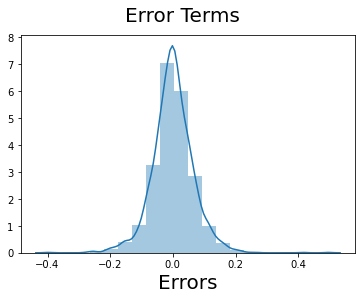

In [66]:
fig = plt.figure()
ax=sns.distplot((y_train-y_train_target),bins=20)
fig.suptitle("Error Terms",fontsize=20)
plt.xlabel('Errors',fontsize=20)

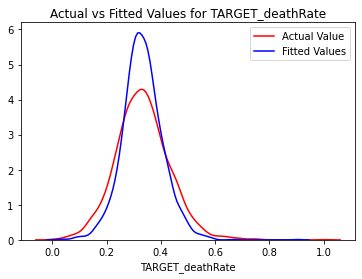

In [67]:
ax1 = sns.distplot(y_train, hist=False, color="r", label="Actual Value")
sns.distplot(y_train_target, hist=False, color="b", label="Fitted Values" , ax=ax1)


plt.title('Actual vs Fitted Values for TARGET_deathRate')


plt.show()
plt.close()

We can see that the fitted values are reasonably close to the actual values, since the two distributions overlap a bit. However, there is definitely some room for improvement.

<h3> making predictions

applying scalign to test dataset

In [68]:
convars=['avgAnnCount','avgDeathsPerYear','TARGET_deathRate','incidenceRate','medIncome','popEst2015','povertyPercent','studyPerCap','MedianAge','MedianAgeMale','MedianAgeFemale','AvgHouseholdSize','PercentMarried','PctNoHS18_24','PctHS18_24','PctBachDeg18_24','PctHS25_Over','PctBachDeg25_Over','PctEmployed16_Over','PctUnemployed16_Over','PctPrivateCoverage','PctPrivateCoverageAlone','PctEmpPrivCoverage','PctPublicCoverage','PctPublicCoverageAlone','PctWhite','PctBlack','PctAsian','PctOtherRace','PctMarriedHouseholds','BirthRate']
df_test[convars]=scaler.transform(df_test[convars])

C:\Users\kanan\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\kanan\AppData\Roaming\Python\Python36\site-packages\pandas\core\indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [69]:
df_test.describe()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
count,762.000000,762.000000,762.000000,762.000000,762.000000,762.000000,762.000000,762.000000,762.000000,762.000000,...,762.000000,762.000000,762.000000,762.000000,762.000000,762.000000,762.000000,762.000000,762.000000,762.000000
mean,0.015511,0.013132,0.326566,0.242772,0.248876,0.010343,0.298906,0.018557,0.036767,0.402934,...,0.017060,0.030184,0.068241,0.014436,0.003937,0.044619,0.013123,0.015748,0.019685,0.006562
std,0.032412,0.030410,0.104275,0.054162,0.124323,0.029314,0.145111,0.053997,0.071815,0.120952,...,0.129581,0.171205,0.252325,0.119357,0.062663,0.206602,0.113878,0.124581,0.139007,0.080791
min,-0.000026,0.000000,-0.101381,0.009745,0.016250,-0.000047,-0.011442,0.000000,0.003490,0.037825,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.001920,0.001785,0.262173,0.214822,0.159736,0.001072,0.192220,0.000000,0.025262,0.328605,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.004876,0.004783,0.328488,0.250845,0.229048,0.002890,0.279176,0.000000,0.030580,0.397163,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.013626,0.011405,0.391261,0.278192,0.310459,0.007601,0.379863,0.011630,0.035400,0.472813,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,0.379362,0.364461,0.677326,0.447494,1.029940,0.446133,0.990847,0.697626,0.992023,0.782506,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


<h3> divide it into X_test and y_test

In [70]:
y_test=df_test.pop('TARGET_deathRate')
X_test=df_test

In [71]:
y_test.shape

(762,)

In [72]:
X_test.shape

(762, 89)

In [73]:
X_train_9.columns

Index(['const', 'incidenceRate', 'MedianAgeFemale', 'PctHS18_24',
       'PctHS25_Over', 'PctBachDeg25_Over', 'PctUnemployed16_Over',
       'PctPublicCoverageAlone', 'PctOtherRace', 'PctMarriedHouseholds',
       'BirthRate', '[22640, 34218.1]', 'Alaska', 'Arizona', 'Arkansas',
       'California', 'Colorado', 'Georgia', 'Hawaii', 'Idaho', 'Iowa',
       'Kentucky', 'Montana', 'New Mexico', 'New York', 'North Carolina',
       'Oklahoma', 'Oregon', 'Pennsylvania', 'Tennessee', 'Utah', 'Virginia'],
      dtype='object')

In [74]:
X_train_9.drop(['const'],inplace=True,axis=1)

In [75]:
X_test_m1=X_test[X_train_9.columns]
X_test_m1=sm.add_constant(X_test_m1)

In [76]:
X_test_m1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 762 entries, 147 to 1280
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   const                   762 non-null    float64
 1   incidenceRate           762 non-null    float64
 2   MedianAgeFemale         762 non-null    float64
 3   PctHS18_24              762 non-null    float64
 4   PctHS25_Over            762 non-null    float64
 5   PctBachDeg25_Over       762 non-null    float64
 6   PctUnemployed16_Over    762 non-null    float64
 7   PctPublicCoverageAlone  762 non-null    float64
 8   PctOtherRace            762 non-null    float64
 9   PctMarriedHouseholds    762 non-null    float64
 10  BirthRate               762 non-null    float64
 11  [22640, 34218.1]        762 non-null    uint8  
 12  Alaska                  762 non-null    uint8  
 13  Arizona                 762 non-null    uint8  
 14  Arkansas                762 non-null   

In [77]:
y_pred_m1=lm9.predict(X_test_m1)

<h3>model evaluation

Text(0, 0.5, 'y_pred')

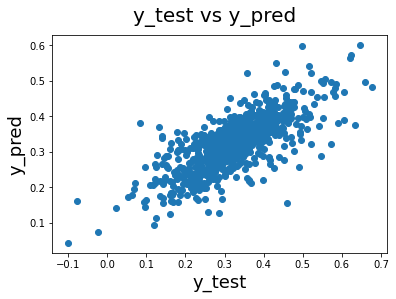

In [78]:
fig=plt.figure()
plt.scatter(y_test,y_pred_m1)
fig.suptitle('y_test vs y_pred',fontsize=20)
plt.xlabel('y_test',fontsize=18)
plt.ylabel('y_pred',fontsize=18)

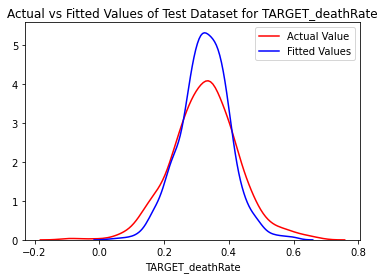

In [79]:
ax1 = sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(y_pred_m1, hist=False, color="b", label="Fitted Values" , ax=ax1)


plt.title('Actual vs Fitted Values of Test Dataset for TARGET_deathRate')


plt.show()
plt.close()

In [80]:
from sklearn import metrics

print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_m1))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_m1))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_m1)))

Mean Absolute Error: 0.0503361345116567
Mean Squared Error: 0.0047229149770521995
Root Mean Squared Error: 0.06872346744054901


In [81]:
df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred_m1})
df1 = df.head(25)

In [82]:
df1.head()

,Actual,Predicted
147,0.208939,0.238352
2304,0.201672,0.291258
962,0.310320,0.324235
821,0.429142,0.346017
221,0.413881,0.434675


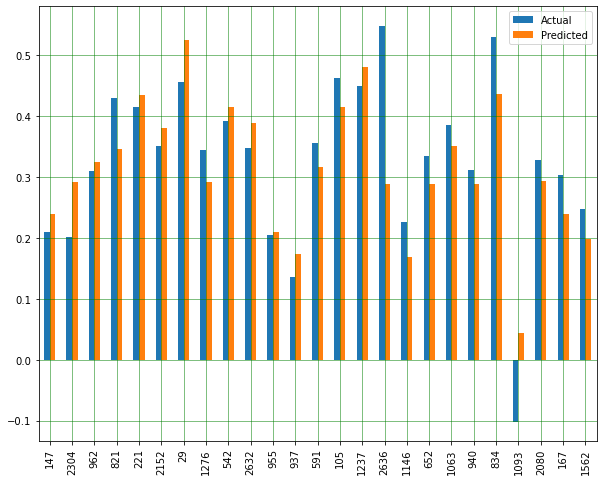

In [83]:
df1.plot(kind='bar',figsize=(10,8))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

Overall we have a decent model, but we also acknowledge that we could do better.

We have a couple of options:

Add new features (avgAnnCount/avgDeathsPerYear/PctWhite etc.)
Build a non-linear model